# Bitcoin Stock Prediction Using Deep Learning and Sentiment Analysis
---

### This notebook analyzes Bitcoin historical values and how we can predict next values for Bitcoin closing prices

## Introduction

Cryptocurrency Stock market prediction is one of the most challenging issues enticing many researchers and investors. Investors worldwide displayed great interest in stock predicting systems. They began relying on predictions systems to make their important business decisions. Despite comprehensive research done on this domain, there still isn't a complete solution to the predicament. Is stock market prediction completely achievable is still debate of the hour. The immense influence of external entities (social, political, psychological, and economic) proposes several obstacles for complete accuracy for prediction. Additionally, it requires huge amount of historical data.  

My research will follow a comparative approach. My first framework is a Recurrent Neural Network trained on 3 popular stock market indicators and past prices as key data points to find an optimal technique for cryptocurrency stock market prediction. 

My second framework is a sequential model, trained on the sentiment of the public company news history and past prices as key data points, consisting of a linear stack of 2 Long Short-Term Memory (LSTM) layers to generate a prediction vector for the whole input sequence and 1 Linear Dense Layer to aggregate the data into a single value.

Comparison will be made on the basis of their performance. Both techniques have some advantages and disadvantages. My research will analyze advantages and limitations of these techniques to find which technique is comparatively better for specifically Bitcoin stock market prediction. 

### What is a crypto currency  and why Bitcoin?

According to wikipedia, a cryptocurrency is a digital asset designed to work as a medium of exchange using "cryptography" to secure the transactions and to control the creation of additional units of the currency by "mining". 

While the best-known example of a cryptocurrency is Bitcoin, there are more than 100 other tradable cryptocurrencies, called altcoins (meaning alternative to Bitcoin), competing each other and with Bitcoin. 

The motive behind this competition is that there are a number of design flaws in Bitcoin, and people are trying to invent new coins to overcome these defects hoping their inventions will eventually replace Bitcoin. 

To June 2017, the total market capital of all cryptocurrencies is 102 billion in USD, 41 of which is of Bitcoin. Therefore, regardless of its design faults, Bitcoin is still the dominant cryptocurrency in markets. As a result, many altcoins cannot be bought with fiat currencies, but only be traded against Bitcoin. 

Hence, I chose Bitcoin as my commodity in order to make wiser future investments for my cryptocurrency portfolio.

## Background

In a traditional recurrent neural network, during the gradient back-propagation phase, the gradient signal can end up being multiplied a large number of times (as many as the number of time steps) by the weight matrix associated with the connections between the neurons of the recurrent hidden layer. This means that, the magnitude of weights in the transition matrix can have a strong impact on the learning process.

If the weights in this matrix are small (or, more formally, if the leading eigenvalue of the weight matrix is smaller than 1.0), it can lead to a situation called vanishing gradients where the gradient signal gets so small that learning either becomes very slow or stops working altogether. It can also exacerbate the task of learning long-term dependencies in the data. Conversely, if the weights in this matrix are large (or, again, more formally, if the leading eigenvalue of the weight matrix is larger than 1.0), it can lead to a situation where the gradient signal is so large that it can cause learning to diverge. This is often referred to as exploding gradients.

These issues are the main motivation behind the LSTM model which introduces a new structure called a memory cell. A memory cell is composed of four main elements: an input gate, a neuron with a self-recurrent connection (a connection to itself), a forget gate and an output gate. The self-recurrent connection has a weight of 1.0 and ensures that, barring any outside interference, the state of a memory cell can remain constant from one time step to another.

![alt text](lstm_memorycell.png "LSTM")

The gates serve to modulate the interactions between the memory cell itself and its environment. The input gate can allow incoming signal to alter the state of the memory cell or block it. On the other hand, the output gate can allow the state of the memory cell to have an effect on other neurons or prevent it. Finally, the forget gate can modulate the memory cell’s self-recurrent connection, allowing the cell to remember or forget its previous state, as needed.

I believe the biggest difference between the NLP and financial analysis is that language has some guarantee of structure, it’s just that the rules of the structure are vague. Markets, on the other hand, don’t come with a promise of a learnable structure, that such a structure exists is the assumption that this project would prove or disprove (rather it might prove or disprove if I can find that structure).

Assuming that a structure exists; the idea of summarizing the current state of the market in the same way we encode the semantics of a paragraph seems plausible to me.

## A Data-Driven Approach To Cryptocurrency Speculation

*How do Bitcoin markets behave? What are the causes of the sudden spikes and dips in cryptocurrency values? How can we predict what will happen next?*

Articles on cryptocurrencies, such as Bitcoin and Ethereum, are rife with speculation these days, with hundreds of self-proclaimed experts advocating for the trends that they expect to emerge. What is lacking from many of these analyses is a strong data analysis foundation to backup the claims. 

So, I felt that analysis of the top headlines on the first page of Google News results for the term **Bitcoin** to predict its closing price for the next day seemed like the most unbiased approach to resolving the biased opinions strewn around the web. I also felt exclusion of the **"Price"** suffix was justified by the fact that its inclusion led to Google News returning those biased news articles as opposed to just news revolving around Bitcoin that I feel is more relevant for my unbiased prediction of closing prices.

This approach also resonates with my personal approach to track the closing prices of the cryptocurrencies I have invested in. I always find myself skimming through the most important headlines on the first page of the Google News results. Extrapolation of my research method to apply to a sample of the population representing crytocurrency investors also seems fair. Don't agree? [This article](https://www.bloomberg.com/news/articles/2017-11-07/bitcoin-rally-is-eroding-gold-s-appeal-top-online-vaulter-says) on Bloomberg Markets does! 

In a nutshell, the article suggests that, according to Google Trends, global searches for “buy bitcoin” have overtaken “buy gold” after previously exceeding searches for how to purchase silver.

**Note** - Numbers represent search interest relative to the highest point on the chart for the given region and time. A value of 100 is the peak popularity for the term. A value of 50 means that the term is half as popular. Likewise a score of 0 means the term was less than 1% as popular as the peak.

![alt text](Buy Bitcoin Google Trends.png "Buy_Bitcoin")

For the rest of the skeptics, I decided to explore Google Trends myself to evaluate the legitimacy of my claim. So the global search for **bitcoin** for the time period **starting from January 3, 2009**; when the first Bitcoin transaction record, or genesis block, kicked off the Bitcoin blockchain and included a reference to a pertinent newspaper headline of that day: 

*The Times 03/Jan/2009 Chancellor on brink of second bailout for banks.*

Sources:
* https://en.bitcoin.it/wiki/Genesis_block
* https://www.mail-archive.com/cryptography@metzdowd.com/msg10142.html

looks like this:

![alt text](Bitcoin Google Trends.png "Buy_Bitcoin")

## Input Data

### Initial Features Set

My initial features set include the Adjusted Open, Adjusted High, Adjusted Low, Adjusted Close, Adjusted Volume for BTC, Adjusted Volume for Currency and Weighted Price for Bitcoin retrieved using [Quandl's free Bitcoin API](https://blog.quandl.com/api-for-bitcoin-data).

I used pickle to serialize and save the downloaded data as a file, which will prevent my script from re-downloading the same data each time I run the script.

In [1]:
# Define Quandl Helper Function to download and cache bitcoin dataset from Quandl
import json
import numpy as np
import pandas as pd
import pickle
import quandl
from datetime import datetime
import plotly.offline as py
import plotly.graph_objs as go
import plotly.figure_factory as ff
py.init_notebook_mode(connected=True)

with open('api_key.json') as f:
    api = json.load(f)
quandl.ApiConfig.api_key = api["api_key"]

def get_quandl_data(quandl_id):
    #Download and cache Quandl dataseries
    cache_path = '{}.pkl'.format(quandl_id).replace('/','-')
    try:
        f = open(cache_path, 'rb')
        df = pickle.load(f)   
        print('Loaded {} from cache'.format(quandl_id))
    except (OSError, IOError) as e:
        print('Downloading {} from Quandl'.format(quandl_id))
        df = quandl.get(quandl_id, returns="pandas")
        df.to_pickle(cache_path)
        print('Cached {} at {}'.format(quandl_id, cache_path))
    return df

# Pull Kraken BTC exchange historical pricing data
btc_usd_price_kraken = get_quandl_data('BCHARTS/KRAKENUSD')

btc_usd_price_kraken.head()

Cached BCHARTS/KRAKENUSD at BCHARTS-KRAKENUSD.pkl


,Open,High,Low,Close,Volume (BTC),Volume (Currency),Weighted Price
Date,,,,,,,
2014-01-07,874.67040,892.06753,810.00000,810.00000,15.622378,13151.472844,841.835522
2014-01-08,810.00000,899.84281,788.00000,824.98287,19.182756,16097.329584,839.156269
2014-01-09,825.56345,870.00000,807.42084,841.86934,8.158335,6784.249982,831.572913
2014-01-10,839.99000,857.34056,817.00000,857.33056,8.024510,6780.220188,844.938794
2014-01-11,858.20000,918.05471,857.16554,899.84105,18.748285,16698.566929,890.671709


In [2]:
# Chart the BTC close pricing data
btc_trace = go.Scatter(x=btc_usd_price_kraken.index, y=btc_usd_price_kraken['Close'])
py.iplot([btc_trace])

### Observations

There are a few notable down-spikes, particularly in late 2014 and early 2016. These spikes are specific to the Kraken dataset, and I obviously don't want them to be reflected in my overall pricing analysis.

The nature of Bitcoin exchanges is that the pricing is determined by supply and demand, hence no single exchange contains a true "master price" of Bitcoin. To solve this issue, along with that of down-spikes, I pulled data from three more major Bitcoin changes to calculate an aggregate Bitcoin price index.

In [3]:
# Pull pricing data for 3 more BTC exchanges
exchanges = ['COINBASE','BITSTAMP','ITBIT']

exchange_data = {}

exchange_data['KRAKEN'] = btc_usd_price_kraken

for exchange in exchanges:
    exchange_code = 'BCHARTS/{}USD'.format(exchange)
    btc_exchange_df = get_quandl_data(exchange_code)
    exchange_data[exchange] = btc_exchange_df

Cached BCHARTS/COINBASEUSD at BCHARTS-COINBASEUSD.pkl
Cached BCHARTS/BITSTAMPUSD at BCHARTS-BITSTAMPUSD.pkl
Cached BCHARTS/ITBITUSD at BCHARTS-ITBITUSD.pkl


In [4]:
# Merge All Of The Pricing Data Into A Single Dataframe
def merge_dfs_on_column(dataframes, labels, col):
    # Merge a single column of each dataframe into a new combined dataframe
    series_dict = {}
    for index in range(len(dataframes)):
        series_dict[labels[index]] = dataframes[index][col]
        
    return pd.DataFrame(series_dict)

# Merge the BTC price dataseries' into a single dataframe on their "Close Price" column
btc_usd_datasets_close = merge_dfs_on_column(list(exchange_data.values()), list(exchange_data.keys()), 'Close')
btc_usd_datasets_open = merge_dfs_on_column(list(exchange_data.values()), list(exchange_data.keys()), 'Open')
btc_usd_datasets_high = merge_dfs_on_column(list(exchange_data.values()), list(exchange_data.keys()), 'High')
btc_usd_datasets_low = merge_dfs_on_column(list(exchange_data.values()), list(exchange_data.keys()), 'Low')

btc_usd_datasets_close.tail()

,BITSTAMP,COINBASE,ITBIT,KRAKEN
Date,,,,
2017-12-06,13623.50,14090.00,13651.98,13737.7
2017-12-07,16599.99,17390.01,16782.72,15899.0
2017-12-08,15800.00,16367.03,16158.92,15921.9
2017-12-09,14607.49,15309.98,15062.92,14682.9
2017-12-10,14500.13,15222.01,15071.80,14703.2


In [5]:
# Visualize The Pricing Datasets

# Helper function to provide a single-line command to compare each column in the dataframe
def df_scatter(df, title, seperate_y_axis=False, y_axis_label='', scale='linear', initial_hide=False):
    #Generate a scatter plot of the entire dataframe
    label_arr = list(df)
    series_arr = list(map(lambda col: df[col], label_arr))
    
    layout = go.Layout(
        title=title,
        legend=dict(orientation="h"),
        xaxis=dict(type='date'),
        yaxis=dict(
            title=y_axis_label,
            showticklabels= not seperate_y_axis,
            type=scale
        )
    )
    
    y_axis_config = dict(
        overlaying='y',
        showticklabels=False,
        type=scale )
    
    visibility = 'visible'
    if initial_hide:
        visibility = 'legendonly'
        
    # Form Trace For Each Series
    trace_arr = []
    for index, series in enumerate(series_arr):
        trace = go.Scatter(
            x=series.index, 
            y=series, 
            name=label_arr[index],
            visible=visibility
        )
        
        # Add seperate axis for the series
        if seperate_y_axis:
            trace['yaxis'] = 'y{}'.format(index + 1)
            layout['yaxis{}'.format(index + 1)] = y_axis_config    
        trace_arr.append(trace)

    fig = go.Figure(data=trace_arr, layout=layout)
    py.iplot(fig)
    
# Plot all of the BTC exchange closing prices
df_scatter(btc_usd_datasets_close, 'Bitcoin Closing Price (USD) By Exchange')

### Observations

Although the four series follow roughly the same path, there are various irregularities in each that should be eliminated. Since the price of Bitcoin has never been equal to zero in the timeframe that I was examining it makes sense to remove all of the zero values from the combined dataframe.

In [6]:
# Remove "0" values
btc_usd_datasets_close.replace(0, np.nan, inplace=True)
btc_usd_datasets_open.replace(0, np.nan, inplace=True)
btc_usd_datasets_high.replace(0, np.nan, inplace=True)
btc_usd_datasets_low.replace(0, np.nan, inplace=True)

# Plot the cleaned dataframe
df_scatter(btc_usd_datasets_close, 'Bitcoin Closing Price (USD) By Exchange')

In [7]:
# Calculate the average BTC closing price as a new column
btc_usd_datasets_close['avg_btc_close_price_usd'] = btc_usd_datasets_close.mean(axis=1)
btc_usd_datasets_open['avg_btc_open_price_usd'] = btc_usd_datasets_open.mean(axis=1)
btc_usd_datasets_high['avg_btc_high_price_usd'] = btc_usd_datasets_high.mean(axis=1)
btc_usd_datasets_low['avg_btc_low_price_usd'] = btc_usd_datasets_low.mean(axis=1)

# Plot the average BTC closing price
btc_trace = go.Scatter(x=btc_usd_datasets_close.index, y=btc_usd_datasets_close['avg_btc_close_price_usd'])
py.iplot([btc_trace])

In [8]:
btc_usd_datasets_close_final = btc_usd_datasets_close['avg_btc_close_price_usd'].copy()
btc_usd_datasets_open_final = btc_usd_datasets_open['avg_btc_open_price_usd'].copy()
btc_usd_datasets_high_final = btc_usd_datasets_high['avg_btc_high_price_usd'].copy()
btc_usd_datasets_low_final = btc_usd_datasets_low['avg_btc_low_price_usd'].copy()

btc_usd_datasets_close_final = btc_usd_datasets_close_final.reset_index()
btc_usd_datasets_open_final = btc_usd_datasets_open_final.reset_index()
btc_usd_datasets_high_final = btc_usd_datasets_high_final.reset_index()
btc_usd_datasets_low_final = btc_usd_datasets_low_final.reset_index()

btc_usd_datasets_open_final.columns = ['Date','Average Open Price (USD)']
btc_usd_datasets_high_final.columns = ['Date','Average High Price (USD)']
btc_usd_datasets_low_final.columns = ['Date','Average Low Price (USD)']
btc_usd_datasets_close_final.columns = ['Date','Average Close Price (USD)']

btc_usd_datasets_open_final = btc_usd_datasets_open_final[btc_usd_datasets_open_final['Date'] > '2011-12-31']
btc_usd_datasets_high_final = btc_usd_datasets_high_final[btc_usd_datasets_high_final['Date'] > '2011-12-31']
btc_usd_datasets_low_final = btc_usd_datasets_low_final[btc_usd_datasets_low_final['Date'] > '2011-12-31']
btc_usd_datasets_close_final = btc_usd_datasets_close_final[btc_usd_datasets_close_final['Date'] > '2011-12-31']

btc_usd_datasets_close_final.head()

,Date,Average Close Price (USD)
110,2012-01-01,5.00
111,2012-01-02,5.00
112,2012-01-03,5.29
113,2012-01-04,5.57
114,2012-01-05,6.65


In [9]:
btc_usd_datasets_final_1 = pd.merge(btc_usd_datasets_open_final, btc_usd_datasets_high_final, on='Date')
btc_usd_datasets_final_2 = pd.merge(btc_usd_datasets_low_final, btc_usd_datasets_close_final, on='Date')                                  
btc_usd_datasets_final = pd.merge(btc_usd_datasets_final_1, btc_usd_datasets_final_2, on='Date') 
btc_usd_datasets_final.to_csv('BTC_USD.csv', index=False)
btc_usd_datasets_final.head()                                   

,Date,Average Open Price (USD),Average High Price (USD),Average Low Price (USD),Average Close Price (USD)
0,2012-01-01,4.58,5.00,4.58,5.00
1,2012-01-02,5.00,5.00,5.00,5.00
2,2012-01-03,5.32,5.32,5.14,5.29
3,2012-01-04,4.93,5.57,4.93,5.57
4,2012-01-05,5.72,6.65,5.72,6.65


### Secondary Features Set

This features set builds out my dataframe from a csv file named [**BTC_USD.csv**](BTC_USD.csv) that I generated by extending the protocol governing the definition of my initial features set.

## The model in theory

I am going to use 4 features: The **close price** and three extra technical indicators.
- MACD (Trend Indicator)
- Stochastics (Momentum Indicator)
- Average True Range (Volume Indicator)

## Functions

### Trend Indicator

[What is a trend?](https://www.investopedia.com/university/technical/techanalysis3.asp)

**Exponential Moving Average:** Is a type of infinite impulse response filter that applies weighting factors which decrease exponentially. The weighting for each older datum decreases exponentially, never reaching zero. It is similar to a simple moving average, except that more weight is given to the latest data. It's also known as the exponentially weighted moving average. This type of moving average reacts faster to recent price changes than a simple moving average. The 12- and 26-day EMAs are the most popular short-term averages and they are used to create indicators like the moving average convergence divergence (MACD) and the percentage price oscillator (PPO). 

![alt text](EMA.png "EMA")

**MACD:**  The Moving Average Convergence/Divergence oscillator (MACD) is one of the simplest and most effective momentum indicators available. The MACD turns two trend-following indicators, moving averages, into a momentum oscillator by subtracting the longer moving average from the shorter moving average.
<img src="http://i68.tinypic.com/289ie1l.png">

### Momentum Indicator

[What is momentum?](https://www.investopedia.com/terms/m/momentum.asp?ad=dirN&qo=investopediaSiteSearch&qsrc=0&o=40186)

**Stochastics oscillator:** The Stochastic Oscillator is a momentum indicator that shows the location of the close relative to the high-low range over a set number of periods. It measures whether the closing price of a security is closer to the high or the low. It is based on the assumption that when a market is trending upward, the closing price will be closer to the highest price, and, when it is trending downward, the closing price will be closer to the lowest price.

<img src="http://i66.tinypic.com/2vam3uo.png">

### Volume Indicator

[What is volume?](https://www.investopedia.com/terms/v/volume.asp)

**Average True Range:** Is an indicator to measure the volalitility (NOT price direction). The true range indicator is the largest of:
- Method A: Current High less the current Low
- Method B: Current High less the previous Close (absolute value)
- Method C: Current Low less the previous Close (absolute value)

The average true range is a moving average, generally 14 days, of the true ranges. Basically a stock experiencing a high level of volatility has a higher ATR, and a low volatility stock has a lower ATR. 

Calculation:
<img src="http://i68.tinypic.com/e0kggi.png">

In [10]:
def MACD(df,period1,period2,periodSignal):
    EMA1 = pd.DataFrame.ewm(df,span=period1).mean()
    EMA2 = pd.DataFrame.ewm(df,span=period2).mean()
    MACD = EMA1-EMA2
    
    Signal = pd.DataFrame.ewm(MACD,periodSignal).mean()
    
    Histogram = MACD-Signal
    
    return Histogram

def stochastics_oscillator(df,period):
    l, h = pd.DataFrame.rolling(df, period).min(), pd.DataFrame.rolling(df, period).max()
    k = 100 * (df - l) / (h - l)
    return k

def ATR(df,period):
    '''
    Method A: Current High less the current Low
    '''
    df['H-L'] = abs(df['Average High Price (USD)']-df['Average Low Price (USD)'])
    '''
    Method B: Current High less the previous Close (absolute value)
    '''
    df['H-PC'] = abs(df['Average High Price (USD)']-df['Average Close Price (USD)'].shift(1))
    '''
    Method C: Current Low less the previous Close (absolute value)
    '''
    df['L-PC'] = abs(df['Average Low Price (USD)']-df['Average Close Price (USD)'].shift(1))
    TR = df[['H-L','H-PC','L-PC']].max(axis=1)
    return TR.to_frame()

### Read Data

In [11]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
pd.options.mode.chained_assignment = None

df = pd.read_csv('BTC_USD.csv',usecols=[1,2,3,4])

dfPrices = pd.read_csv('BTC_USD.csv',usecols=[4])

In [12]:
dfPrices.head(2)

,Average Close Price (USD)
0,5.0
1,5.0


## Plot Data

### Plotting Price

In [13]:
price = dfPrices.iloc[len(dfPrices.index)-60:len(dfPrices.index)].as_matrix().ravel()

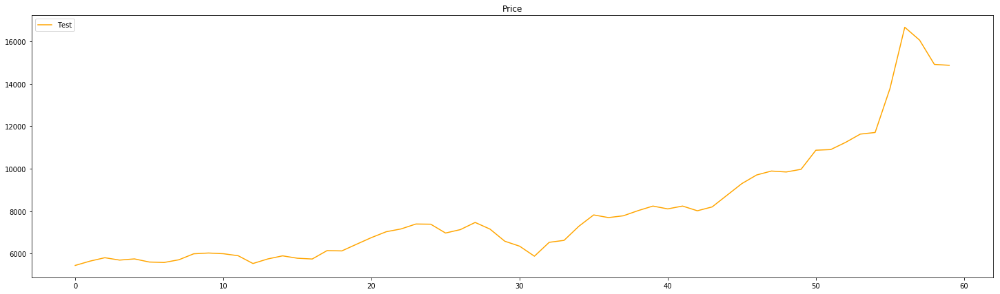

In [14]:
prices = dfPrices.iloc[len(dfPrices.index)-60:len(dfPrices.index)].as_matrix().ravel()
plt.figure(figsize=(25,7))
plt.plot(prices,label='Test',color='orange')
plt.title('Price')
plt.legend(loc='upper left')
plt.show()

### Plotting MACD

In [15]:
macd = MACD(dfPrices.iloc[len(dfPrices.index)-60:len(dfPrices.index)],12,26,9)

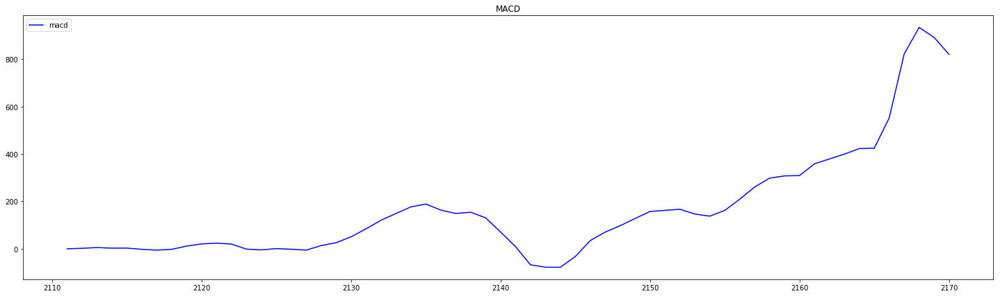

In [16]:
plt.figure(figsize=(25,7))
plt.plot(macd,label='macd',color='blue')
plt.title('MACD')
plt.legend(loc='upper left')
plt.show()

### Plotting Stochastics Oscillator

In [17]:
stochastics = stochastics_oscillator(dfPrices.iloc[len(dfPrices.index)-60:len(dfPrices.index)],14)

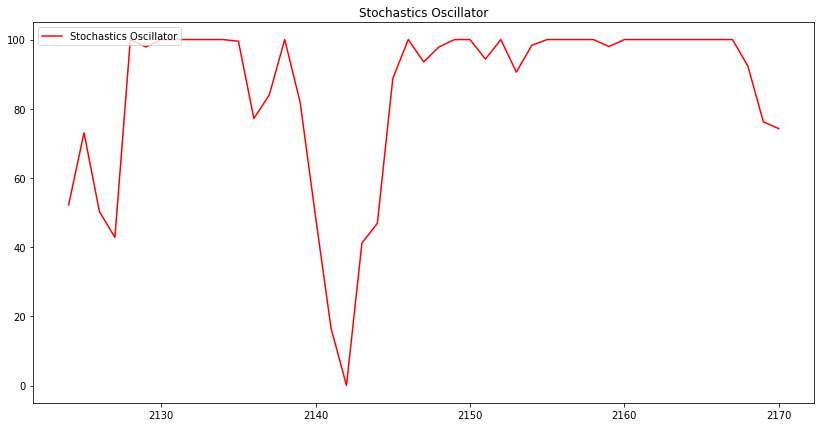

In [18]:
plt.figure(figsize=(14,7))
#First 100 points due to extreme density
plt.plot(stochastics[0:100],label='Stochastics Oscillator',color='red')
plt.title('Stochastics Oscillator')
plt.legend(loc='upper left')
plt.show()

### Plotting Average True Range

In [19]:
atr = ATR(df.iloc[len(df.index)-60:len(df.index)],14)

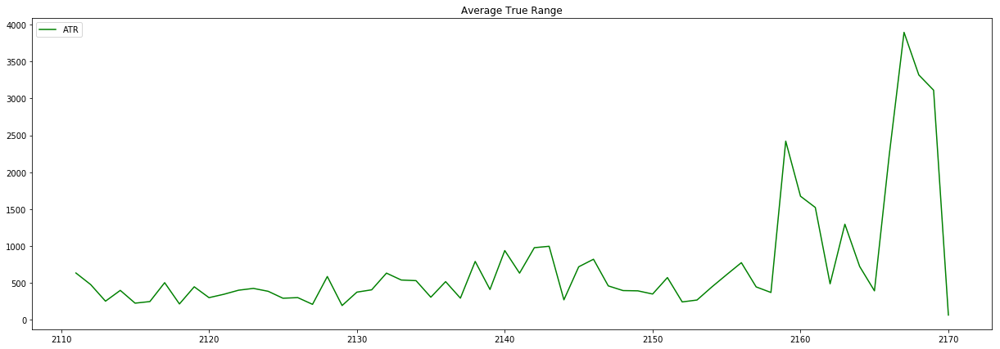

In [20]:
plt.figure(figsize=(21,7))
#First 100 points due to extreme density
plt.plot(atr[0:100],label='ATR',color='green')
plt.title('Average True Range')
plt.legend(loc='upper left')
plt.show()

## Create Final Dataframe and Save Data

In [21]:
dfPriceShift = dfPrices.shift(-1)
dfPriceShift.rename(columns={'Average Close Price (USD)':'Average Close Price Target (USD)'}, inplace=True)
dfPriceShift.head(2)

,Average Close Price Target (USD)
0,5.00
1,5.29


In [22]:
macd = MACD(dfPrices,12,26,9)
macd.rename(columns={'Average Close Price (USD)':'MACD'}, inplace=True)

In [23]:
stochastics = stochastics_oscillator(dfPrices,14)
stochastics.rename(columns={'Average Close Price (USD)':'Stochastics'}, inplace=True)

In [24]:
atr = ATR(df,14)
atr.rename(columns={0:'ATR'}, inplace=True)

In [25]:
final_data = pd.concat([dfPrices,dfPriceShift,macd,stochastics,atr], axis=1)
# Delete the entries with missing values (where the stochastics couldn't be computed yet) 
final_data = final_data.dropna()

In [26]:
final_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2157 entries, 13 to 2169
Data columns (total 5 columns):
Average Close Price (USD)           2157 non-null float64
Average Close Price Target (USD)    2157 non-null float64
MACD                                2157 non-null float64
Stochastics                         2157 non-null float64
ATR                                 2157 non-null float64
dtypes: float64(5)
memory usage: 101.1 KB


In [27]:
final_data

,Average Close Price (USD),Average Close Price Target (USD),MACD,Stochastics,ATR
13,6.3000,7.1500,-0.000919,60.747664,0.3000
14,7.1500,7.1000,0.023633,100.000000,0.8500
15,7.1000,6.0000,0.035161,97.311828,0.9500
16,6.0000,7.1000,-0.019609,27.215190,1.1000
17,7.1000,6.2200,0.004027,95.652174,1.1100
18,6.2200,6.9500,-0.031235,19.130435,1.5800
19,6.9500,6.7700,-0.013259,82.608696,0.7300
20,6.7700,6.7900,-0.012223,66.956522,0.6700
21,6.7900,6.5200,-0.011057,68.695652,0.8000
22,6.5200,6.5500,-0.027349,45.217391,0.7900


In [28]:
final_data.to_csv('BTC_USD_TechnicalIndicators.csv',index=False)

# First Framework - Recurrent Neural Network trained on Initial Features (Historical Bitcoin Prices) and Secondary Features ( Fiat Currency Stock Market Technical Indicators)

In [29]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
%matplotlib inline

## Read the data

In [30]:
df = pd.read_csv('BTC_USD_TechnicalIndicators.csv')
df.head(2)

,Average Close Price (USD),Average Close Price Target (USD),MACD,Stochastics,ATR
0,6.30,7.15,-0.000919,60.747664,0.30
1,7.15,7.10,0.023633,100.000000,0.85


## Normalize the data

In [31]:
dfNorm = (df - df.mean()) / (df.max() - df.min())
dfNorm.head()

,Average Close Price (USD),Average Close Price Target (USD),MACD,Stochastics,ATR
0,-0.046232,-0.046595,-0.004132,0.002090,-0.013989
1,-0.046181,-0.046598,-0.004111,0.394614,-0.013847
2,-0.046184,-0.046664,-0.004101,0.367732,-0.013822
3,-0.046250,-0.046598,-0.004148,-0.333235,-0.013783
4,-0.046184,-0.046651,-0.004128,0.351135,-0.013781


## Defining the Hyperparameters

In [32]:
num_epochs = 100
total_series_length = len(df.index)
# Sequence Size
truncated_backprop_length = 3
# Number of neurons
state_size = 12 
num_classes = 1
num_features = 4
batch_size = 1
num_batches = total_series_length//batch_size//truncated_backprop_length
min_test_size = 100

print('The total length of the series is: {}'.format(total_series_length))
print('The current configuration gives us {} batches of {} observation each, where each one is looking {} steps in the past'.format(num_batches,batch_size,truncated_backprop_length))

The total length of the series is: 2157
The current configuration gives us 719 batches of 1 observation each, where each one is looking 3 steps in the past


## Splitting the data into Training and Testing sets

In [33]:
dfTrain = dfNorm[df.index < num_batches*batch_size*truncated_backprop_length]


for i in range(min_test_size,len(dfNorm.index)):
    
    if(i % truncated_backprop_length*batch_size == 0):
        test_first_idx = len(dfNorm.index)-i
        break

dfTest =  dfNorm[df.index >= test_first_idx]

In [34]:
dfTrain.head()

,Average Close Price (USD),Average Close Price Target (USD),MACD,Stochastics,ATR
0,-0.046232,-0.046595,-0.004132,0.002090,-0.013989
1,-0.046181,-0.046598,-0.004111,0.394614,-0.013847
2,-0.046184,-0.046664,-0.004101,0.367732,-0.013822
3,-0.046250,-0.046598,-0.004148,-0.333235,-0.013783
4,-0.046184,-0.046651,-0.004128,0.351135,-0.013781


In [35]:
dfTest.head()

,Average Close Price (USD),Average Close Price Target (USD),MACD,Stochastics,ATR
2055,0.228121,0.237242,0.003177,0.375693,0.022903
2056,0.237656,0.248782,0.010409,0.394614,0.034549
2057,0.249195,0.230324,0.024248,0.394614,0.048348
2058,0.230738,0.230325,0.010929,0.064841,0.107545
2059,0.230738,0.213713,-0.001845,0.064852,0.065319


In [36]:
xTrain = dfTrain[['Average Close Price (USD)','MACD','Stochastics','ATR']].as_matrix()
yTrain = dfTrain['Average Close Price Target (USD)'].as_matrix()

In [37]:
print(xTrain[0:3],'\n',yTrain[0:3])

[[-0.04623233 -0.0041321   0.00209016 -0.01398865]
 [-0.04618132 -0.00411066  0.39461353 -0.01384749]
 [-0.04618432 -0.00410059  0.36773181 -0.01382182]] 
 [-0.04659497 -0.04659797 -0.04666398]


In [38]:
xTest = dfTest[['Average Close Price (USD)','MACD','Stochastics','ATR']].as_matrix()
yTest = dfTest['Average Close Price Target (USD)'].as_matrix()

In [39]:
print(xTest[0:3],'\n',yTest[0:3])

[[ 0.22812136  0.00317722  0.37569306  0.02290328]
 [ 0.23765585  0.01040933  0.39461353  0.03454876]
 [ 0.24919546  0.02424778  0.39461353  0.04834756]] 
 [ 0.23724221  0.24878181  0.23032403]


## Visualizing the starting average close price data

In [40]:
start_avg_cp_train_trace = go.Scatter(y=xTrain[:,0])
layout = dict(title = 'Train Data (' + str(len(xTrain)) + ' data points)')
fig = dict(data=[start_avg_cp_train_trace], layout=layout)
py.iplot(fig)

In [41]:
start_avg_cp_test_trace = go.Scatter(y=xTest[:,0])
layout = dict(title = 'Test Data (' + str(len(xTest)) + ' data points)')
fig = dict(data=[start_avg_cp_test_trace], layout=layout)
py.iplot(fig)

## Placeholders

In [42]:
batchX_placeholder = tf.placeholder(dtype=tf.float32,shape=[None,truncated_backprop_length,num_features],name='data_ph')
batchY_placeholder = tf.placeholder(dtype=tf.float32,shape=[None,truncated_backprop_length,num_classes],name='target_ph')

## Weights and Biases

Since I have considered a 3 layer neural network comprising of:

1. Input Layer
2. Hidden Recurrent Layer
3. Output Layer

and output is a result of linear activation of last layer of RNN; we need only a single pair Weight and Bias.

In [43]:
weight = tf.Variable(tf.truncated_normal([state_size,num_classes]))
bias = tf.Variable(tf.constant(0.1,shape=[num_classes]))
# Unpack
labels_series = tf.unstack(batchY_placeholder, axis=1)

## Forward Pass (Unroll the cell)

Input to RNN

In [44]:
cell = tf.contrib.rnn.BasicRNNCell(num_units=state_size)

states_series, current_state = tf.nn.dynamic_rnn(cell=cell,inputs=batchX_placeholder,dtype=tf.float32)

states_series = tf.transpose(states_series,[1,0,2])

## Backward Pass (Output)

In [45]:
last_state = tf.gather(params=states_series,indices=states_series.get_shape()[0]-1)
last_label = tf.gather(params=labels_series,indices=len(labels_series)-1)

## Prediction, Loss and Optimizer

In [46]:
prediction = tf.matmul(last_state,weight) + bias
prediction

<tf.Tensor 'add:0' shape=(?, 1) dtype=float32>

In [47]:
loss = tf.reduce_mean(tf.squared_difference(last_label,prediction))
train_step = tf.train.AdamOptimizer(learning_rate=0.001).minimize(loss)

/Users/Arjun/anaconda/lib/python3.6/site-packages/tensorflow/python/ops/gradients_impl.py:96: UserWarning:

Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.



In [48]:
loss_list = []
test_pred_list = []

with tf.Session() as sess:
    
    tf.global_variables_initializer().run()
    
    for epoch_idx in range(num_epochs):
                
        print('Epoch {}'.format(epoch_idx))
        
        for batch_idx in range(num_batches):
            start_idx = batch_idx * truncated_backprop_length
            end_idx = start_idx + truncated_backprop_length * batch_size
        
            
            batchX = xTrain[start_idx:end_idx,:].reshape(batch_size,truncated_backprop_length,num_features)
            batchY = yTrain[start_idx:end_idx].reshape(batch_size,truncated_backprop_length,1)
            
            feed = {batchX_placeholder : batchX, batchY_placeholder : batchY}
            
            # TRAIN
            _loss,_train_step,_pred,_last_label,_prediction = sess.run(
                fetches=[loss,train_step,prediction,last_label,prediction],
                feed_dict = feed
            )
            
            loss_list.append(_loss)
            
           
            
            if(batch_idx % 200 == 0):
                print('Step {} - Loss: {:.6f}'.format(batch_idx,_loss))
                
    # TEST 
    for test_idx in range(len(xTest) - truncated_backprop_length):
        
        testBatchX = xTest[test_idx:test_idx+truncated_backprop_length,:].reshape((1,truncated_backprop_length,num_features))        
        testBatchY = yTest[test_idx:test_idx+truncated_backprop_length].reshape((1,truncated_backprop_length,1))

        feed = {batchX_placeholder : testBatchX,
            batchY_placeholder : testBatchY}

        # test_pred contains 'window_size' predictions, we want the last one
        _last_state,_last_label,test_pred = sess.run([last_state,last_label,prediction],feed_dict=feed)
        # The last test_pred
        test_pred_list.append(test_pred[-1][-1]) 

Epoch 0
Step 0 - Loss: 0.000049
Step 200 - Loss: 0.000548
Step 400 - Loss: 0.000000
Step 600 - Loss: 0.000023
Epoch 1
Step 0 - Loss: 0.020972
Step 200 - Loss: 0.000002
Step 400 - Loss: 0.000023
Step 600 - Loss: 0.000009
Epoch 2
Step 0 - Loss: 0.001932
Step 200 - Loss: 0.000003
Step 400 - Loss: 0.000022
Step 600 - Loss: 0.000006
Epoch 3
Step 0 - Loss: 0.005333
Step 200 - Loss: 0.000066
Step 400 - Loss: 0.000038
Step 600 - Loss: 0.000012
Epoch 4
Step 0 - Loss: 0.015545
Step 200 - Loss: 0.000010
Step 400 - Loss: 0.000032
Step 600 - Loss: 0.000004
Epoch 5
Step 0 - Loss: 0.011313
Step 200 - Loss: 0.000005
Step 400 - Loss: 0.000030
Step 600 - Loss: 0.000006
Epoch 6
Step 0 - Loss: 0.015295
Step 200 - Loss: 0.000023
Step 400 - Loss: 0.000029
Step 600 - Loss: 0.000009
Epoch 7
Step 0 - Loss: 0.003512
Step 200 - Loss: 0.000015
Step 400 - Loss: 0.000024
Step 600 - Loss: 0.000006
Epoch 8
Step 0 - Loss: 0.009938
Step 200 - Loss: 0.000015
Step 400 - Loss: 0.000024
Step 600 - Loss: 0.000012
Epoch 9
St

Step 200 - Loss: 0.000000
Step 400 - Loss: 0.000008
Step 600 - Loss: 0.000003
Epoch 75
Step 0 - Loss: 0.000029
Step 200 - Loss: 0.000001
Step 400 - Loss: 0.000002
Step 600 - Loss: 0.000002
Epoch 76
Step 0 - Loss: 0.000338
Step 200 - Loss: 0.000000
Step 400 - Loss: 0.000005
Step 600 - Loss: 0.000003
Epoch 77
Step 0 - Loss: 0.000411
Step 200 - Loss: 0.000000
Step 400 - Loss: 0.000001
Step 600 - Loss: 0.000002
Epoch 78
Step 0 - Loss: 0.000038
Step 200 - Loss: 0.000000
Step 400 - Loss: 0.000001
Step 600 - Loss: 0.000002
Epoch 79
Step 0 - Loss: 0.000047
Step 200 - Loss: 0.000000
Step 400 - Loss: 0.000002
Step 600 - Loss: 0.000002
Epoch 80
Step 0 - Loss: 0.000001
Step 200 - Loss: 0.000001
Step 400 - Loss: 0.000002
Step 600 - Loss: 0.000002
Epoch 81
Step 0 - Loss: 0.000012
Step 200 - Loss: 0.000000
Step 400 - Loss: 0.000002
Step 600 - Loss: 0.000002
Epoch 82
Step 0 - Loss: 0.000035
Step 200 - Loss: 0.000001
Step 400 - Loss: 0.000002
Step 600 - Loss: 0.000002
Epoch 83
Step 0 - Loss: 0.000000
S

In [49]:
trace = go.Scatter(
    x = np.arange(0,len(loss_list)),
    y = loss_list,
    mode = 'markers', 
)

layout = go.Layout(
    title= "Loss",  
    xaxis=dict(
    title='epochs',
    ), 
    yaxis=dict(
    title='loss',
    )  
)

data = go.Data([trace])

fig = go.Figure(data = data, layout = layout)

py.iplot(fig)

In [50]:
avg_cp_trace = go.Scatter(y=yTest, name = 'Average Close Price (USD)', line = dict(color = ('rgb(205, 12, 24)'), width = 4))
pred_avg_cp_trace = go.Scatter(y=test_pred_list, name = 'Predicted Average Close Price (USD)', line = dict(color = ('rgb(22, 96, 167)'), width = 4))
layout = dict(title = 'Average Close Price (USD) vs Predicted Average Close Price (USD)')
fig = dict(data=[avg_cp_trace, pred_avg_cp_trace], layout=layout)
py.iplot(fig)

# Second Framework - LSTM trained on Initial Features (Historical Bitcoin Prices) and Secondary Features (Sentiments of Top Articles for each day from 01/01/2012 to 12/12/2017)

You can get a deeper understanding of how I scraped the articles and computed their sentiments in my notebooks titled [Google News Scraper](Google News Scraper.ipynb) and [Sentiment Analysis of Top Google News Articles for keyword bitcoin](Sentiment Analysis of Top Google News Articles for keyword bitcoin.ipynb).